***
# <span style='color:Blue'>Face Recognition</span>
**By** **_<span style='color:Crimson'>Abhinandita Dash</span>_**
***

**Overall Project Description**
- The project has 3 parts with the following objectives.
  1. Part A: To construct a face detection system and visualize the predicted masks on the faces in the image.
  2. Part B: To build a model to detect the faces present on all the images and save its bounding box coordinates.
  3. Part C: Devise a face identification model to recognize human faces.

In [1]:
import pandas as pd              # Perform operations on data frames
import numpy as np               # Perform numeric operations on data
import matplotlib.pyplot as plt  # For static visualizations
%matplotlib inline 
import seaborn as sns            # For advanced visualizations
import scipy.stats as stats      # To perform statistical operations
from scipy.stats import zscore
import warnings
import random
from zipfile import ZipFile
import os
import math
from numpy import array
from glob import glob
from PIL import Image
from tqdm.notebook import tqdm

import tensorflow as tf
from sklearn import preprocessing
from sklearn.model_selection  import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.layers import Concatenate, Conv2D, Reshape, UpSampling2D
from tensorflow.keras.layers import Dropout, Flatten, Activation, ZeroPadding2D, Convolution2D, MaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.decomposition import PCA
from sklearn.svm import SVC

import cv2

# PartA

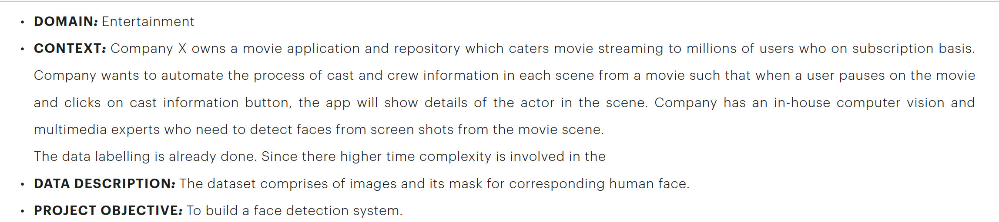

## Understand the data

### Import and read ‘images.npy’

In [2]:
#Loading the pickled image file
img_array = np.load('images.npy', allow_pickle=True)

In [3]:
#Check the shape of the image array
img_array.shape

(409, 2)

In [4]:
#Check the type of the data
type(img_array)

numpy.ndarray

In [5]:
#Check the 1st element of the 1st record
img_array[0][0].shape

(333, 650, 3)

In [6]:
#Check the 2nd element of the 1st record
img_array[0][1]

[{'label': ['Face'],
  'notes': '',
  'points': [{'x': 0.08615384615384615, 'y': 0.3063063063063063},
   {'x': 0.1723076923076923, 'y': 0.45345345345345345}],
  'imageWidth': 650,
  'imageHeight': 333},
 {'label': ['Face'],
  'notes': '',
  'points': [{'x': 0.583076923076923, 'y': 0.2912912912912913},
   {'x': 0.6584615384615384, 'y': 0.46846846846846846}],
  'imageWidth': 650,
  'imageHeight': 333}]

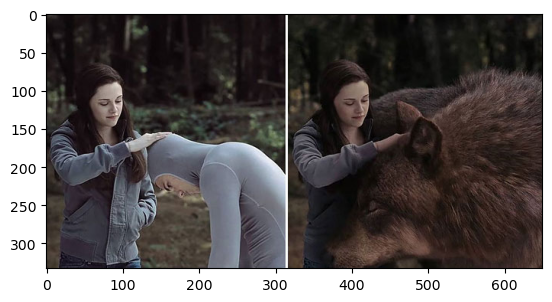

In [7]:
#Display one of the images
plt.imshow(img_array[0, 0])

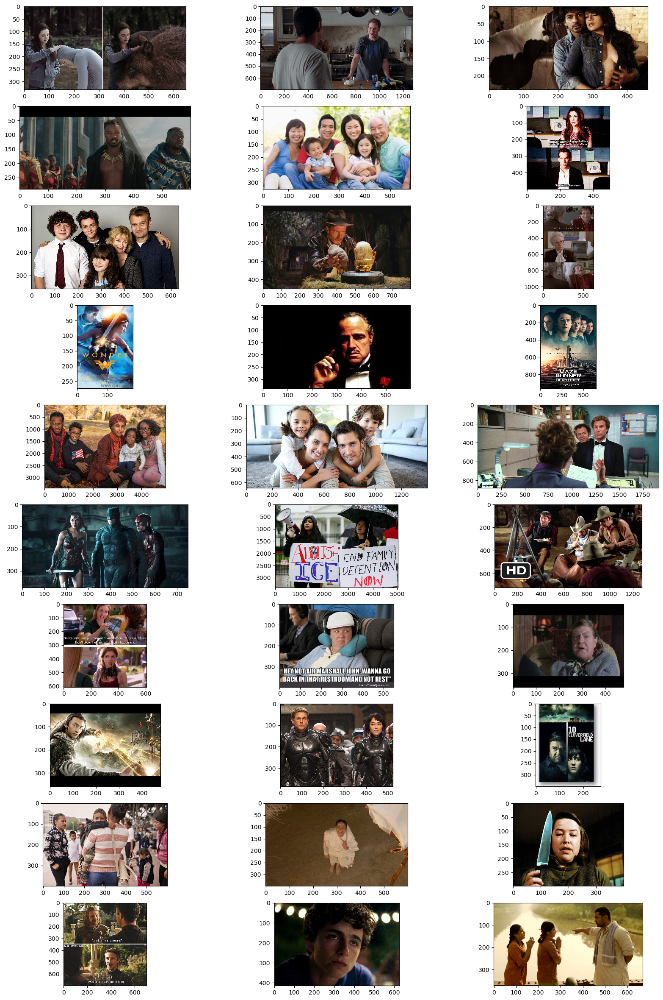

In [8]:
#Taking a look at first few images
fi,ax = plt.subplots(10,3,figsize=(20,30))
row = 0
col = 0
index = 0
for i in range(30):
    ax[row][col].imshow(img_array[index][0], interpolation='nearest')
    index = index + 1
    col = col + 1
    if col > 2:
        row = row + 1
        col = 0
plt.show()

### Split the data into Features(X) & labels(Y). Unify shape of all the images

In [9]:
#Split the data into Features(X) and labels(Y)
X = img_array[:,0]
Y = img_array[:,1]

In [10]:
#Confirm the shape of both X and Y
X.shape, Y.shape

((409,), (409,))

In [11]:
#Check the different color modes in the data
channels = set()
for index in range(len(img_array)):
    colormode = Image.fromarray(img_array[index][0]).mode
    channels.add(colormode)
print("Types of image modes in the input data:", channels)

Types of image modes in the input data: {'RGBA', 'RGB', 'L'}


In [12]:
#Unify the shape of all images 
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
X_unified = []
for index in range(len(img_array)):
    #Check the colormodes and convert it to RGB 
    colormodes = Image.fromarray(img_array[index][0]).mode
    if (colormodes=="RGBA"):
        rgba = cv2.cvtColor(img_array[index][0], cv2.COLOR_RGBA2RGB)
        #resize the image  
        rgba_sized = cv2.resize(rgba, dsize=(IMAGE_WIDTH,IMAGE_HEIGHT), interpolation=cv2.INTER_CUBIC)
        #Scale the pixel values
        X_unified.append(rgba_sized/255)
        #X_train.append(preprocess_input(rgba_sized))
    elif(colormodes=="L"):
        lmode = cv2.cvtColor(img_array[index][0], cv2.COLOR_GRAY2RGB)
        lmode_sized = cv2.resize(lmode, dsize=(IMAGE_WIDTH,IMAGE_HEIGHT), interpolation=cv2.INTER_CUBIC)
        X_unified.append(lmode_sized/255)
        #X_train.append(preprocess_input(lmode_sized))
    else:
        rgb_sized = cv2.resize(img_array[index][0], dsize=(IMAGE_WIDTH,IMAGE_HEIGHT), interpolation=cv2.INTER_CUBIC)
        X_unified.append(rgb_sized/255)
        #X_train.append(preprocess_input(rgb_sized))

        #Check the shape of the unified data
X_unified = np.array(X_unified)
print(X_unified.shape)

(409, 224, 224, 3)


In [13]:
#Generate the masks using the coordinates in Y
Y_mask = np.zeros((int(img_array.shape[0]), IMAGE_HEIGHT, IMAGE_WIDTH))
for index in range(len(img_array)):
    for i in img_array[index][1]:
        x1 = int(i["points"][0]['x'] * IMAGE_WIDTH)
        x2 = int(i["points"][1]['x'] * IMAGE_WIDTH)
        y1 = int(i["points"][0]['y'] * IMAGE_HEIGHT)
        y2 = int(i["points"][1]['y'] * IMAGE_HEIGHT)
        Y_mask[index][y1:y2, x1:x2] = 1

In [14]:
#Check the shape of Y
Y_mask.shape

(409, 224, 224)

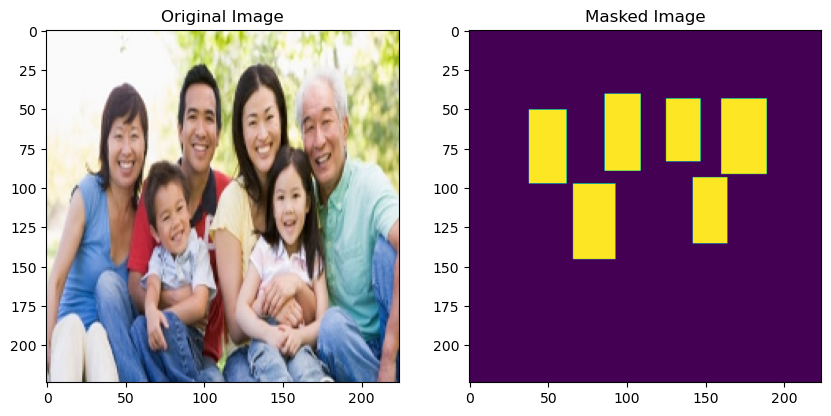

In [15]:
#Display original image and masked image for one record
f, axarr = plt.subplots(1,2, figsize=(10,10))
axarr[0].imshow(X_unified[4])
axarr[1].imshow(Y_mask[4])
axarr[0].title.set_text('Original Image')
axarr[1].title.set_text('Masked Image')
plt.show()

### Split the data into train and test[400:9]

In [16]:
#Split the data into train and test in the ratio 400:9
X_train,X_test, y_train,y_test = train_test_split(X_unified, Y_mask, train_size = 400, test_size=9, random_state=104)

In [17]:
#Check the shape of X after split
X_train.shape, X_test.shape

((400, 224, 224, 3), (9, 224, 224, 3))

In [18]:
#Check the shape of Y after split
y_train.shape, y_test.shape

((400, 224, 224), (9, 224, 224))

### Select random image from the train data and display original image and masked image

In [19]:
#Function to generate n random images from the train data
def getNRandomImages(val): 
    np.random.seed(9)
    rand = np.random.randint(0, len(X_train), val)
    print(rand)
    for i,j in enumerate(rand):
        f, axarr = plt.subplots(1, 2, figsize=(5,5))
        axarr[0].imshow(X_train[j])
        axarr[1].imshow(y_train[j])
        axarr[0].title.set_text('Original Image')
        axarr[1].title.set_text('Masked Image')
        plt.axis('off')
        #return  
    plt.show()

[382 348 126  56 251]


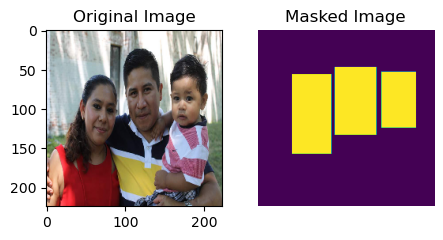

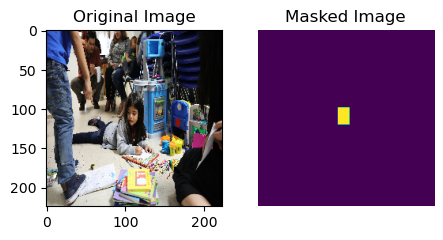

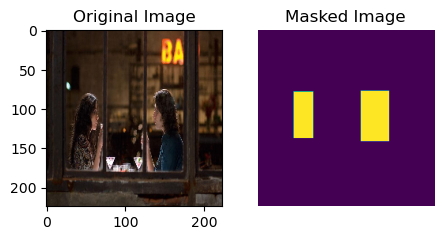

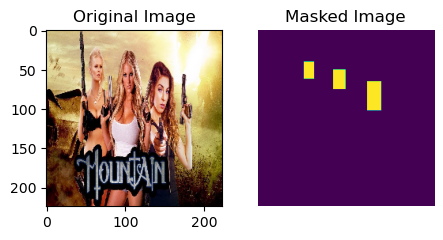

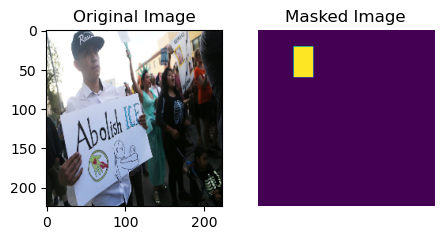

In [20]:
n = 5
getNRandomImages(n)

## Model building

### Design a face mask detection model

In [21]:
#Define the image height and weight
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224

In [22]:
#Create a UNET model using MobileNet as the base architecture. 
def create_model(trainable=False):
    model = MobileNet(input_shape=(IMAGE_HEIGHT, IMAGE_WIDTH, 3), include_top=False, weights="imagenet")

    for layer in model.layers:
        layer.trainable = trainable
    
    #Save the required blocks for encoding and decoding
    block00 = model.layers[0].input
    block01 = model.get_layer("conv_pw_1_relu").output
    block02 = model.get_layer("conv_pw_2_relu").output
    block03 = model.get_layer("conv_pw_3_relu").output
    block05 = model.get_layer("conv_pw_5_relu").output
    block11 = model.get_layer("conv_pw_11_relu").output
    block13 = model.get_layer("conv_pw_13_relu").output

    decoderBlock = Concatenate()([UpSampling2D()(block13), block11])
    decoderBlock = Concatenate()([UpSampling2D()(decoderBlock), block05])
    decoderBlock = Concatenate()([UpSampling2D()(decoderBlock), block03])
    decoderBlock = Concatenate()([UpSampling2D()(decoderBlock), block01])
    decoderBlock = Concatenate()([UpSampling2D()(decoderBlock), block00])

    decoderBlock = Conv2D(1, kernel_size=1, activation="sigmoid")(decoderBlock)
    decoderBlock = Reshape((IMAGE_HEIGHT, IMAGE_WIDTH))(decoderBlock)

    return Model(inputs=model.input, outputs=decoderBlock) 

In [23]:
model = create_model(False)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 112, 112, 32  128         ['conv1[0][0]']                  
                                )                                                             

### Design your own Dice Coefficient and Loss function

In [24]:
#Function to calculate the dice coefficient
def dice_coefficient(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)

    return numerator / (denominator + tf.keras.backend.epsilon())

In [25]:
#Function to calculate the Loss
def loss(y_true, y_pred):
    return binary_crossentropy(y_true, y_pred) - tf.keras.backend.log(dice_coefficient(y_true, y_pred) + tf.keras.backend.epsilon())

### Train and tune the model as required

In [26]:
#Optimize the model using Adam optimiser and compile the model with the defined parameters
optimizer = Adam(learning_rate=1e-4)
model.compile(loss=loss, optimizer=optimizer, metrics=[dice_coefficient])

In [27]:
#Create checkpoint to monitor the validation loss and apply for earlystopping and reduce plateau
checkpoint = ModelCheckpoint("model-{val_loss:.2f}.h5", monitor="val_loss", verbose=1, save_best_only=True, save_weights_only=True)
stop = EarlyStopping(monitor="val_loss", patience=5)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=1e-6, verbose=1)

In [28]:
#Fit the model
model.fit(X_train, y_train, validation_split=0.2, epochs=25, batch_size=8, verbose=1)

Epoch 1/25


2023-04-15 19:13:10.762422: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


40/40 [==============================] - 71s 2s/step - loss: 2.6514 - dice_coefficient: 0.1743 - val_loss: 2.2189 - val_dice_coefficient: 0.2106
Epoch 2/25
40/40 [==============================] - 71s 2s/step - loss: 2.1199 - dice_coefficient: 0.2126 - val_loss: 1.8609 - val_dice_coefficient: 0.2693
Epoch 3/25
40/40 [==============================] - 69s 2s/step - loss: 1.7908 - dice_coefficient: 0.2678 - val_loss: 1.6069 - val_dice_coefficient: 0.3164
Epoch 4/25
40/40 [==============================] - 71s 2s/step - loss: 1.5257 - dice_coefficient: 0.3220 - val_loss: 1.4366 - val_dice_coefficient: 0.3579
Epoch 5/25
40/40 [==============================] - 71s 2s/step - loss: 1.3760 - dice_coefficient: 0.3579 - val_loss: 1.3120 - val_dice_coefficient: 0.3949
Epoch 6/25
40/40 [==============================] - 70s 2s/step - loss: 1.2482 - dice_coefficient: 0.3970 - val_loss: 1.2222 - val_dice_coefficient: 0.4207
Epoch 7/25
40/40 [==============================] - 71s 2s/step - loss: 1.1

### Evaluate and share insights on performance of the model

In [29]:
#Evaluate the performance of the model on the test data
modelScore = model.evaluate(X_test, y_test)

1/1 [==============================] - 2s 2s/step - loss: 0.9483 - dice_coefficient: 0.5015


In [30]:
print("Model shows a Dice los and coefficient of", round(modelScore[0],2), "and", round(modelScore[1],2), "on test data")

Model shows a Dice los and coefficient of 0.95 and 0.5 on test data


**<span style='color:Blue'>Observations</span>**
- Model shows an overall good score in terms of Dice coefficient and loss.
- It means that the masks predicted by the model are well overlapping over the actual faces in the images
- The performance of model can still be improved by hyperparameter tuning

### Test the model predictions on the test image: ‘image with index 3 in the test data’ and visualize the predicted masks on the faces in the image

In [31]:
# Get the required test image with index 3
test_image = X_test[3]

# Reshape the image to meet the input requirements of the model
test_img_reshape = test_image.reshape(1, 224, 224, 3)

# Predict the mask for test image
pred = model.predict(test_img_reshape)

1/1 [==============================] - 0s 323ms/step


In [32]:
# Function to draw mask on the original image
def getMaskedOriginalImage(initialImage, predictionMask):
    tempImage = initialImage
    tempImage2 = tempImage
    tempImage2[:,:,0] = predictionMask*tempImage[:,:,0]
    tempImage2[:,:,1] = predictionMask*tempImage[:,:,1]
    tempImage2[:,:,2] = predictionMask*tempImage[:,:,2]
    out = tempImage2
    return out

In [33]:
# Get the masked image based on predictions
out_image = getMaskedOriginalImage(X_test[3].copy(), pred[0])

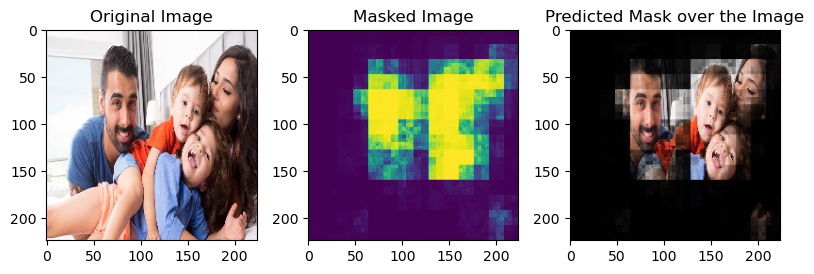

In [34]:
# Visualize the predicted mask on the test image
f, axarr = plt.subplots(1,3, figsize=(8, 8))
axarr[0].imshow(X_test[3])
axarr[1].imshow(pred[0])
axarr[2].imshow(out_image)
axarr[0].title.set_text('Original Image')
axarr[1].title.set_text('Masked Image')
axarr[2].title.set_text('Predicted Mask over the Image')
plt.tight_layout()

# PartB

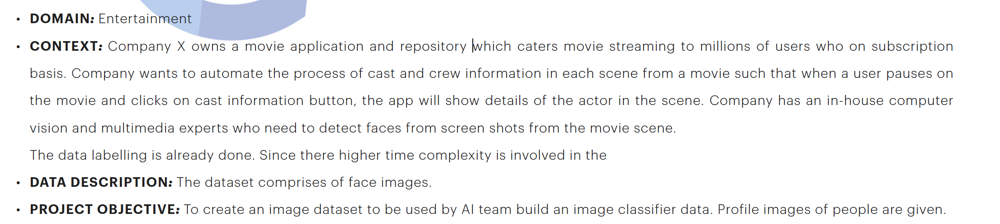

### Read/import images from folder ‘training_images’

In [35]:
# Unzipping the 'training_images' folder to import data in the following question
with ZipFile("training_images-20211126T092819Z-001.zip", 'r') as imgs:
    imgs.extractall()

In [36]:
#Getting the image list 
dirpath = 'training_images/'

In [37]:
#Fectching the image path
files = glob(os.path.join(dirpath, "*.jpg"))

In [38]:
# Number of images
len(files)

1091

### Loop that will iterate through all the images in the ‘training_images’ folder and detect the faces present on all the images

In [39]:
#Check the colormode of the images
chan = set()
for file in files:
    img = cv2.imread(file)
    colormode1 = Image.fromarray(img).mode
    chan.add(colormode1)
print("Types of image modes in the input data:", chan)

Types of image modes in the input data: {'RGB'}


In [40]:
#Function to check the number of faces detected in an image
def processFaces(faces):
    if len(faces) == 0:
        x = np.nan
        y = np.nan
        w = np.nan
        h = np.nan
    elif len(faces) == 1:
        x,y,w,h = faces[0]
    else:
        x = []
        y = []
        w = []
        h = []
        for (xCord,yCord,width,height) in faces:
            x.append(xCord)
            y.append(yCord)
            w.append(width)
            h.append(height)
    return x, y, w, h


In [41]:
# Initialize variables to store image arrays, and coordinates for the boxes
Image_Name = []
xCoords =[]
yCoords =[]
widths = []
heights = []
Totalfaces = []
count = 0
imagesWithBoxes = []

outdir = "images_with_boxes/"
os.makedirs(outdir, exist_ok=True)

#Detect faces on all the images by using the `haarcascade_frontalface_default.xml` model
face_detector = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

# In a for loop, detect faces for all the images 
for i in files:
    img = cv2.imread(i)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    #Detect the bounding boxes in the image using detectMultiScale() of CascadeClassifier
    faces = face_detector.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=3,
                                           minSize=(30, 30))
    
    # Draw a box over image using predicted coordinates
    for (x,y,w,h) in faces:
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
        
    # Append images into an initialized array
    imagesWithBoxes.append(img)
    
    # Save image with boxes into output directory
    ofn = os.path.join(outdir,'faces_' + os.path.basename(i))
    cv2.imwrite(ofn, img)
    
    # Append the number of faces
    Totalfaces.append(len(faces))
    
    # Append the name of image
    Image_Name.append(os.path.basename(i))
    
    # Get the coordinates of the bounding box
    x,y,w,h = processFaces(faces)
    
    # Append the coordinates
    xCoords.append(x)
    yCoords.append(y)
    widths.append(w)
    heights.append(h)
        

In [42]:
#Function to display random images along with the bounding boxes
def displayImageWithBoxes(num): 
    np.random.seed(42)
    rand = np.random.randint(0, len(imagesWithBoxes), num)
    print(rand)
    plt.figure(figsize=(20,20))
    for i,j in enumerate(rand):
        plt.subplot(1, len(rand), i+1)
        plt.imshow(cv2.cvtColor(imagesWithBoxes[j], cv2.COLOR_BGR2RGB))
        plt.axis('off')
    plt.show()

[ 860 1044  121]


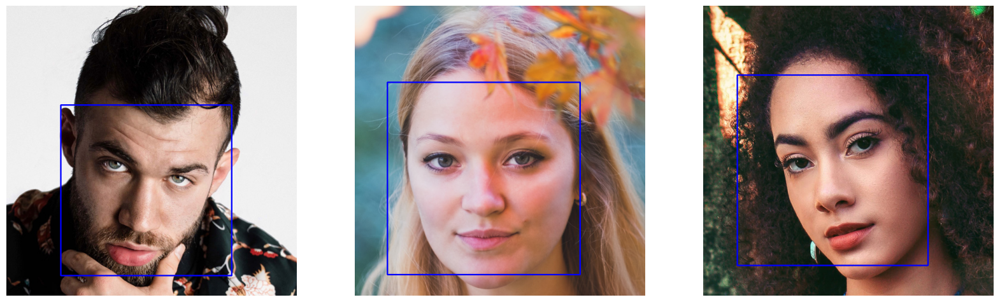

In [43]:
n = 3
displayImageWithBoxes(n)

### Extract metadata of the faces and write into a DataFrame

In [44]:
#Create a dataframe using lists populated in previous question to store the bounding box metadata information 
faceMetrics = pd.DataFrame({
    'x' : xCoords,
    'y' : yCoords,
    'w' : widths,
    'h' : heights,
    'Faces' : Totalfaces,
    'Image_Name' : Image_Name
})

In [45]:
faceMetrics.head()

,x,y,w,h,Faces,Image_Name
0,95,149,387,387,1,real_00251.jpg
1,64,80,457,457,1,real_00537.jpg
2,114,152,385,385,1,real_00523.jpg
3,87,138,384,384,1,real_00245.jpg
4,99,161,430,430,1,real_00279.jpg


### Save the output Dataframe in .csv format

In [46]:
#Save the dataframe in .csv format
faceMetrics.to_csv("Images_Metadata.csv", index=False)

# PartC

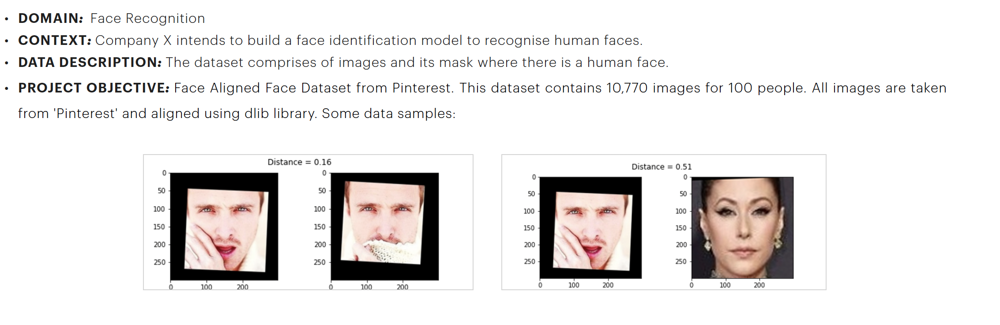

### Unzip, read and Load data(‘PINS.zip’) into session

In [47]:
# specifying the zip file name
file_name = "PINS.zip"
  
# opening the zip file in READ mode
with ZipFile(file_name, 'r') as zip:
    zip.extractall()
    print('Done!')

Done!


In [48]:
#List the image folders
! ls PINS/

pins_Aaron Paul               pins_Ryan Reynolds
pins_Alvaro Morte             pins_Sarah Wayne Callies
pins_Amanda Crew              pins_Scarlett Johansson
pins_Amaury Nolasco           pins_Sebastian Stan
pins_Anna Gunn                pins_Sophie Turner
pins_Benedict Cumberbatch     pins_Stephen Amell
pins_Betsy Brandt             pins_Sundar Pichai
pins_Brenton Thwaites         pins_Thomas Middleditch
pins_Brit Marling             pins_Tom Cavanagh
pins_Bryan Cranston           pins_Ursula Corbero
pins_Caity Lotz               pins_Wentworth Miller
pins_Cameron Monaghan         pins_Willa Holland
pins_Chance Perdomo           pins_William Fichtner
pins_Chris Evans              pins_alexandra daddario
pins_Chris Pratt              pins_alycia debnam carey face
pins_Cobie Smulders           pins_amber heard face
pins_Danielle Panabaker       pins_anne hathaway
pins_Dave Franco              pins_barbara palvin face
pins_Dominic Purcell          pins_bellamy blake face
pins_Dwayne John

In [49]:
pinsDir = "./PINS/"

In [50]:
! ls ./PINS/ | wc -l

     100


### Write function to create metadata of the image

In [51]:
#Function to create metadata of the image
class IdentityMetadata():
    def __init__(self, base, name, file):
        # print(base, name, file)
        # dataset base directory
        self.base = base
        # identity name
        self.name = name
        # image file name
        self.file = file

    def __repr__(self):
        return self.image_path()

    def image_path(self):
        return os.path.join(self.base, self.name, self.file) 

### Store image metadata using class and its function

In [52]:
baseDir = "./PINS/"
name = "pins_Sundar Pichai"
file = "Sundar Pichai2_740.jpg"

In [53]:
pinsSundarMeta = IdentityMetadata(baseDir, name, file)

In [54]:
pinsSundarMeta

./PINS/pins_Sundar Pichai/Sundar Pichai2_740.jpg

In [55]:
pinsSundarMeta.name

'pins_Sundar Pichai'

In [56]:
pinsSundarMeta.file

'Sundar Pichai2_740.jpg'

In [57]:
pinsSundarMeta.image_path()

'./PINS/pins_Sundar Pichai/Sundar Pichai2_740.jpg'

### Loop to iterate through each and every image and create metadata for all the images

In [58]:
#Function to iterate through all images
def load_metadata(path):
    metadata = []
    for i in os.listdir(path):
        for f in os.listdir(os.path.join(path, i)):
            # Check file extension. Allow only jpg/jpeg' files.
            ext = os.path.splitext(f)[1]
            if ext == '.jpg' or ext == '.jpeg':
                metadata.append(IdentityMetadata(path, i, f))
    return np.array(metadata)

In [59]:
# Call load_metadata to read the images and assign metadata to a variable
pinsMetadata = load_metadata(pinsDir)

In [60]:
pinsMetadata.shape

(10770,)

In [61]:
pinsMetadata[10769].name

'pins_tati gabrielle'

In [62]:
! ls ./PINS/ | wc -l

     100


In [63]:
# Write a function to read image using opencv and convert it from BGR to RGB

def load_image(path):
    img = cv2.imread(path) #OpenCV loads images with color channels # in BGR order
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [64]:
 load_image(pinsMetadata[0].image_path())

array([[[67, 56, 50],
        [62, 51, 45],
        [56, 45, 39],
        ...,
        [22, 19, 12],
        [23, 18, 12],
        [23, 18, 12]],

       [[65, 54, 48],
        [64, 53, 47],
        [56, 45, 39],
        ...,
        [22, 19, 12],
        [23, 18, 12],
        [23, 18, 12]],

       [[61, 50, 46],
        [59, 48, 42],
        [47, 36, 30],
        ...,
        [22, 19, 12],
        [23, 18, 12],
        [23, 18, 12]],

       ...,

       [[60, 40, 41],
        [60, 40, 41],
        [56, 36, 37],
        ...,
        [30, 21, 16],
        [31, 22, 17],
        [31, 22, 17]],

       [[60, 40, 41],
        [60, 40, 41],
        [57, 37, 38],
        ...,
        [30, 21, 16],
        [31, 22, 17],
        [31, 22, 17]],

       [[61, 41, 42],
        [60, 40, 41],
        [57, 37, 38],
        ...,
        [30, 21, 16],
        [31, 22, 17],
        [31, 22, 17]]], dtype=uint8)

### Generate Embeddings vectors on the each face in the dataset

#### Function to define the model architecture

In [65]:
def vgg_face():
    model = Sequential()
    model.add(ZeroPadding2D((1,1),input_shape=(224,224, 3)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))
    
    model.add(Convolution2D(4096, (7, 7), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(4096, (1, 1), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Convolution2D(2622, (1, 1)))
    model.add(Flatten())
    model.add(Activation('softmax'))
    return model

In [66]:
#Load defined weights `vgg_face_weights.h5` to the model 
model02 = vgg_face()
model02.load_weights('vgg_face_weights.h5')

In [67]:
model02.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 zero_padding2d (ZeroPadding  (None, 226, 226, 3)      0         
 2D)                                                             
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      1792      
                                                                 
 zero_padding2d_1 (ZeroPaddi  (None, 226, 226, 64)     0         
 ng2D)                                                           
                                                                 
 conv2d_2 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                        

#### Generate vgg_face_descriptor

In [68]:
vgg_face_descriptor = Model(inputs=model02.layers[0].input, outputs=model02.layers[-2].output)

In [69]:
# Get embedding vector for first image in the metadata using the pre-trained model

img_path = pinsMetadata[0].image_path()
img = load_image(img_path)

# Normalising pixel values from [0-255] to [0-1]
img = (img / 255.).astype(np.float32)

img = cv2.resize(img, dsize = (224,224))
print(img.shape)

# Get the embedding vector for the above image using vgg_face_descriptor model and print the shape 

embedding_vector_test = vgg_face_descriptor.predict(np.expand_dims(img, axis=0))[0]
print(embedding_vector_test.shape)

(224, 224, 3)
1/1 [==============================] - 0s 210ms/step
(2622,)


#### Generate embeddings for all images
- The following code iterates through metadata and create embeddings for each image using vgg_face_descriptor.predict() and store in a list with name embeddings

- If there is any error in reading any image in the dataset, it fills the emebdding vector of that image with 2622-zeroes in the `except` block. 

In [70]:
embeddings = []
embeddings = np.zeros((pinsMetadata.shape[0], 2622))
for i, meta in enumerate(pinsMetadata):
  try:
    image = load_image(str(meta))
    image = (image/255.).astype(np.float32)
    image = cv2.resize(image, (224, 224))
    embeddings[i] = vgg_face_descriptor.predict(np.expand_dims(image, axis = 0), verbose = 0)[0]
  except:
    embeddings[i] = np.zeros(2622)

### Build distance metrics for identifying the distance between two similar and dissimilar images

#### Function to calculate distance between given 2 pairs of images.

- Consider distance metric as "Squared L2 distance"
- Squared l2 distance between 2 points (x1, y1) and (x2, y2) = (x1-x2)^2 + (y1-y2)^2

In [71]:
def distance(emb1, emb2):
    return np.sum(np.square(emb1 - emb2))

#### Plot images and get distance between the pairs given below
- 2, 3 and 2, 180
- 30, 31 and 30, 100
- 70, 72 and 70, 115

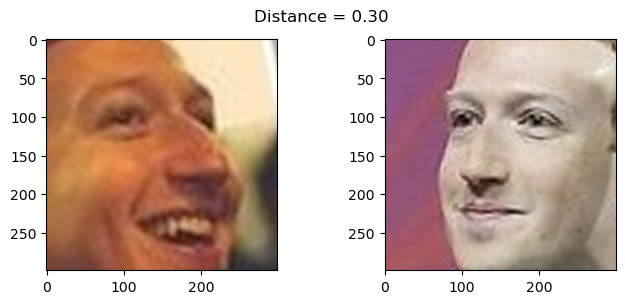

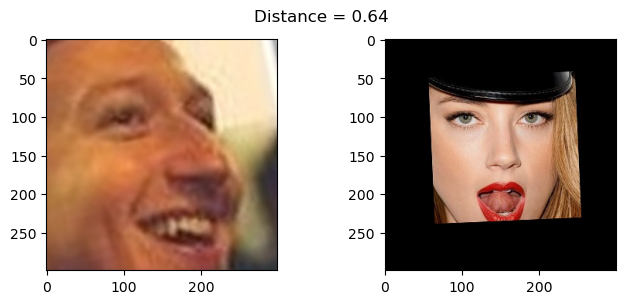

In [72]:
import matplotlib.pyplot as plt

def show_pair(idx1, idx2):
    plt.figure(figsize=(8,3))
    plt.suptitle(f'Distance = {distance(embeddings[idx1], embeddings[idx2]):.2f}')
    plt.subplot(121)
    plt.imshow(load_image(pinsMetadata[idx1].image_path()))
    plt.subplot(122)
    plt.imshow(load_image(pinsMetadata[idx2].image_path()));    

show_pair(2, 3)
show_pair(2, 180)

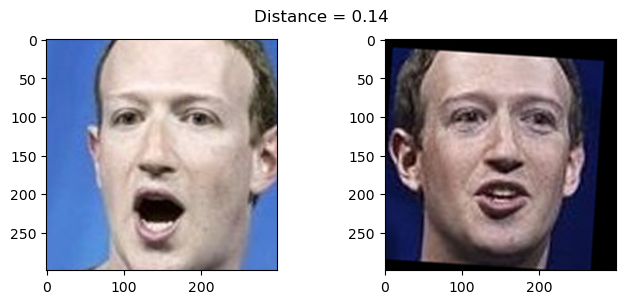

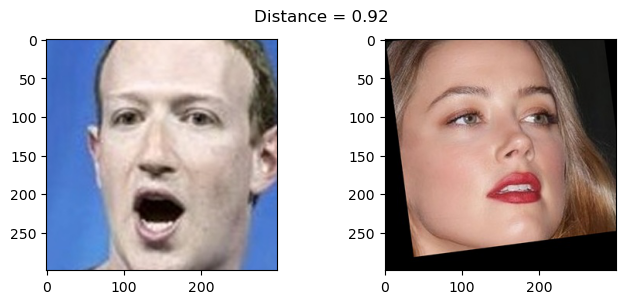

In [73]:
show_pair(30, 31)
show_pair(30, 100)

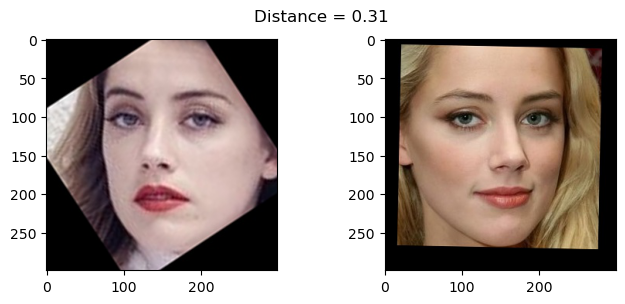

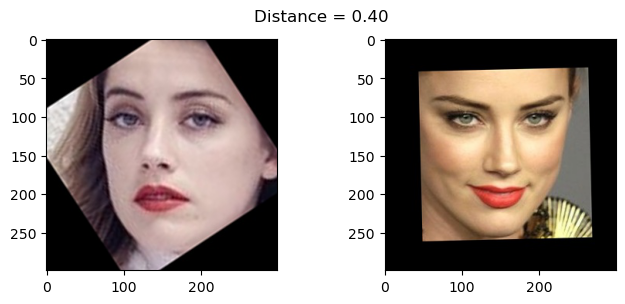

In [74]:
show_pair(70, 72)
show_pair(70, 115)

**<span style='color:Blue'>Observations</span>**
- As expected the distances between similar images are low whereas that between dissimilar images are high 

### PCA used for dimensionality reduction

- Create X_train, X_test and y_train, y_test
- Use train_idx to separate out training features and labels
- Use test_idx to seperate out testing features and labels

In [75]:
train_idx = np.arange(pinsMetadata.shape[0]) % 9 != 0
test_idx = np.arange(pinsMetadata.shape[0]) % 9 == 0

# one half as train examples of 10 identities
X_train = embeddings[train_idx]
# another half as test examples of 10 identities
X_test = embeddings[test_idx]

targets = np.array([m.name for m in pinsMetadata])
y_train = targets[train_idx]
y_test = targets[test_idx]

In [76]:
len(np.arange(pinsMetadata.shape[0]) % 9 == 0)

10770

In [77]:
print('X_train shape : ({0},{1})'.format(X_train.shape[0], X_train.shape[1]))
print('y_train shape : ({0},)'.format(y_train.shape[0]))
print('X_test shape : ({0},{1})'.format(X_test.shape[0], X_test.shape[1]))
print('y_test shape : ({0},)'.format(y_test.shape[0]))

X_train shape : (9573,2622)
y_train shape : (9573,)
X_test shape : (1197,2622)
y_test shape : (1197,)


- Encode the targets
- Use LabelEncoder

In [78]:
#Apply label encoder to encode target values, i.e. y
label_en = LabelEncoder()
y_train_encoded = label_en.fit_transform(y_train)

In [79]:
print(label_en.classes_)
y_test_encoded = label_en.transform(y_test)

['pins_Aaron Paul' 'pins_Alvaro Morte' 'pins_Amanda Crew'
 'pins_Amaury Nolasco' 'pins_Anna Gunn' 'pins_Benedict Cumberbatch'
 'pins_Betsy Brandt' 'pins_Brenton Thwaites' 'pins_Brit Marling'
 'pins_Bryan Cranston' 'pins_Caity Lotz' 'pins_Cameron Monaghan'
 'pins_Chance Perdomo' 'pins_Chris Evans' 'pins_Chris Pratt'
 'pins_Cobie Smulders' 'pins_Danielle Panabaker' 'pins_Dave Franco'
 'pins_Dominic Purcell' 'pins_Dwayne Johnson' 'pins_Emilia Clarke'
 'pins_Emily Bett Rickards' 'pins_Emma Stone' 'pins_Gwyneth Paltrow'
 'pins_Henry Cavil' 'pins_Jason Momoa' 'pins_Jeremy Renner'
 'pins_Jesse Eisenberg' 'pins_Jim Parsons' 'pins_Jon Bernthal'
 'pins_Josh Radnor' 'pins_Kit Harington' 'pins_Krysten Ritter'
 'pins_Kumail Nanjiani' 'pins_Maisie Williams' 'pins_Mark Ruffalo'
 'pins_Martin Starr' 'pins_Melissa benoit' 'pins_Mike Colter'
 'pins_Morena Baccarin' 'pins_Morgan Freeman' 'pins_Natalie Portman'
 'pins_Neil Patrick Harris' 'pins_Paul Rudd' 'pins_Pedro Alonso'
 'pins_Peter Dinklage' 'pins_R

In [80]:
#Display the encoded y labels of train and test data
print('y_train_encoded : ', y_train_encoded)
print('y_test_encoded : ', y_test_encoded)

y_train_encoded :  [88 88 88 ... 96 96 96]
y_test_encoded :  [88 88 88 ... 96 96 96]


- Scale the features using StandardScaler

In [81]:
# Standarize features using StandardScaler
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)

In [82]:
X_test_std = scaler.transform(X_test)

In [83]:
#Display the shape of train and test data after standardization
print('X_train_std shape : ({0},{1})'.format(X_train_std.shape[0], X_train_std.shape[1]))
print('y_train_encoded shape : ({0},)'.format(y_train_encoded.shape[0]))
print('X_test_std shape : ({0},{1})'.format(X_test_std.shape[0], X_test_std.shape[1]))
print('y_test_encoded shape : ({0},)'.format(y_test_encoded.shape[0]))

X_train_std shape : (9573,2622)
y_train_encoded shape : (9573,)
X_test_std shape : (1197,2622)
y_test_encoded shape : (1197,)


- Reduce feature dimensions using Principal Component Analysis
- Set the parameter n_components=128

In [84]:
#Apply the dimensionality reduction using PCA 
pca = PCA(n_components=128)
X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)

### SVM classifier to map each image to its right person

 - Train the SVM classifier and print the score

In [85]:
svm = SVC(C=5., gamma=0.001)
svm.fit(X_train_pca, y_train_encoded)

SVC(C=5.0, gamma=0.001)

In [86]:
SVM_Accuracy_train =svm.score(X_train_pca, y_train_encoded)
print("Train Accuracy : ", SVM_Accuracy_train)

SVM_Accuracy_test =svm.score(X_test_pca,y_test_encoded)
print("Test Accuracy : ", SVM_Accuracy_test)

Train Accuracy :  0.9998955395382848
Test Accuracy :  0.9532163742690059


In [87]:
y_predict = svm.predict(X_test_pca)

In [88]:
print('y_predict : ',y_predict)
print('y_test_encoded : ',y_test_encoded)

y_predict :  [88 88 88 ... 96 96 96]
y_test_encoded :  [88 88 88 ... 96 96 96]


In [89]:
y_predict_encoded = label_en.inverse_transform(y_predict)

In [90]:
print('y_predict shape : ', y_predict.shape)
print('y_test_encoded shape : ', y_test_encoded.shape)

y_predict shape :  (1197,)
y_test_encoded shape :  (1197,)


- Check y encoding for a few of the images

In [91]:
y_test_encoded[0:10]

array([88, 88, 88, 88, 88, 88, 88, 65, 65, 65])

In [92]:
y_predict_encoded[0:10]

array(['pins_mark zuckerberg', 'pins_mark zuckerberg',
       'pins_mark zuckerberg', 'pins_mark zuckerberg',
       'pins_mark zuckerberg', 'pins_mark zuckerberg',
       'pins_mark zuckerberg', 'pins_amber heard face',
       'pins_amber heard face', 'pins_amber heard face'], dtype='<U29')

### Import and display the the test images

In [93]:
testImages = glob("test_images/*.jpg")

In [94]:
testImages

['test_images/Benedict+Cumberbatch9.jpg', 'test_images/Dwayne+Johnson4.jpg']

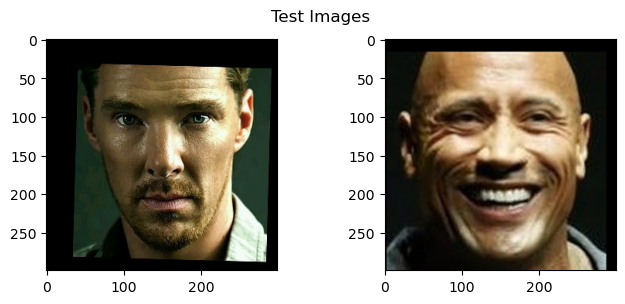

In [95]:
plt.figure(figsize=(8,3))
plt.suptitle("Test Images")
plt.subplot(121)
plt.imshow(load_image(testImages[0]))
plt.subplot(122)
plt.imshow(load_image(testImages[1]));    

### Trained SVM model used to predict the face on both test images

In [96]:
# Create embeddings for the scaled and resized test images
testEmbeddings = []
for testImage in testImages:
    image = load_image(testImage)
    image = (image/255.).astype(np.float32)
    image = cv2.resize(image, (224, 224))
    ImgEmbedding = vgg_face_descriptor.predict(np.expand_dims(image, axis = 0), verbose = 0)[0]
    testEmbeddings.append(ImgEmbedding)

In [97]:
# Apply standard scaling
testEmbeddingScaled = scaler.transform(testEmbeddings)

In [98]:
# Apply PCA transformation
testEmbeddingScaled_pca = pca.transform(testEmbeddingScaled)

In [99]:
# Predict the faces on test images
testImages_predict = svm.predict(testEmbeddingScaled_pca)

In [100]:
# Show encoded labels for predicted faces
testImages_predict

array([ 5, 19])

In [101]:
# Get actual labels for the predicted faces
label_en.classes_[testImages_predict]

array(['pins_Benedict Cumberbatch', 'pins_Dwayne Johnson'], dtype='<U29')

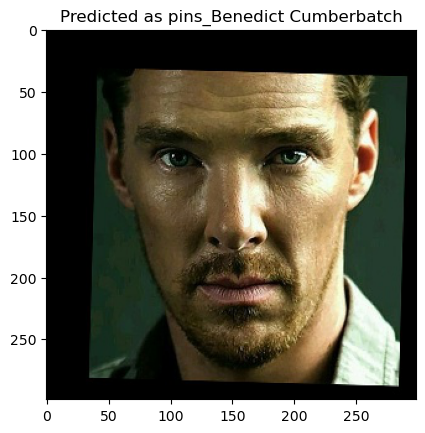

In [102]:
# Display images with predicted labels
plt.imshow(load_image(testImages[0]))
plt.title("Predicted as " + label_en.classes_[testImages_predict[0]]);

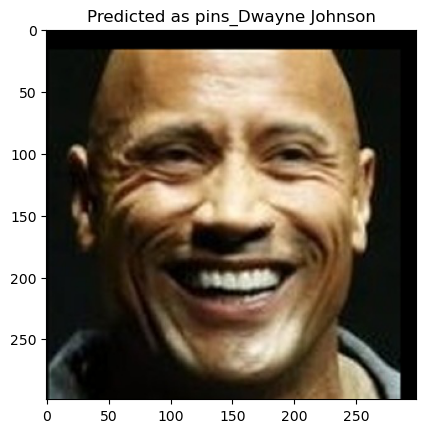

In [103]:
plt.imshow(load_image(testImages[1]))
plt.title("Predicted as " + label_en.classes_[testImages_predict[1]]);

**<span style='color:Blue'>Observations</span>**
- It can be seen that the model has accurately predicted the face labels for both of the test images